https://www.youtube.com/watch?v=DZUYjit-ctc 

https://www.youtube.com/watch?v=Y0j0_cdC7sM 

https://www.youtube.com/watch?v=hoWDjR8bgZY

https://www.youtube.com/watch?v=BwQ7dXAGRaA&t=108s

https://www.youtube.com/watch?v=bpXQN2WkAgg&t=31s

https://www.youtube.com/watch?v=Q2lVamFgcdo -

https://www.youtube.com/watch?v=TpRyyHPlnAc jhin_adc

https://www.youtube.com/watch?v=_-lMdVf7Tlo

https://www.youtube.com/watch?v=l0bQpPcGaRY galio_mid

https://www.youtube.com/watch?v=6_kqVCSTmw8 taliyah_mid

https://www.youtube.com/watch?v=3uEspcVVmRg lucian_adc

https://www.youtube.com/watch?v=SBLdKuO95Nw kaisa_adc

https://www.youtube.com/watch?v=TJHlKCabG20 yunara_adc

https://www.youtube.com/watch?v=sn38x_pAOQg jayce_top

https://www.youtube.com/watch?v=ttvZ_CbQkVk kled_top

https://www.youtube.com/watch?v=p9AinXiHnF4 ornn_top

https://www.youtube.com/watch?v=qMwWg4ZTWtc qiyana_jungle

https://www.youtube.com/watch?v=ZW_22r5hcjc trundle_jungle

https://www.youtube.com/watch?v=42SZL-vW9cM diana_jungle -

In [413]:
# ═══════════════════════════════════════════════════════════════════════════
# CELL 1: SETUP + IMPORTS + CONFIG
# ═══════════════════════════════════════════════════════════════════════════

import cv2
import numpy as np
import polars as pl
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm

# Directories
VIDEO_DIR = Path("./raw_videos")
OUTPUT_DIR = Path("./processed_frames")
OUTPUT_DIR.mkdir(exist_ok=True)

METADATA_PATH = Path("./metadata.csv")

# ═══════════════════════════════════════════════════════════════════════════
# VIDEO CONFIGURATION
# ═══════════════════════════════════════════════════════════════════════════

video_config = {
    # "katarina_mid.mp4": {
    #     "start_offset_seconds": 8,  
    #     "game_start_time": 10,
    #     "end_offset_seconds": 2139,
    #     "mask_zones": [
    #     # (x1, y1, x2, y2)
    #     (0, 0, 1920, 120),
    #     (0, 850, 380, 1080),   
    #     (580, 840, 1480, 1080),
    #     (0, 0, 400, 200),
    #     (0, 0, 100, 700),
    #     (1820, 0, 1920, 700),
    #     (1720, 700, 1920, 800)
    # ]
    # },
    # "twitch_adc.mp4": {
    #     "start_offset_seconds": 8,  
    #     "game_start_time": 11,
    #     "end_offset_seconds": 1865,
    #     "mask_zones": [
    #     # (x1, y1, x2, y2)
    #     (0, 0, 1920, 120),
    #     (0, 850, 380, 1080),   
    #     (580, 840, 1480, 1080),
    #     (0, 0, 400, 200),
    #     (0, 0, 100, 700),
    #     (1820, 0, 1920, 700),
    #     (1720, 700, 1920, 800)
    # ]
    # },
    "zed_jungle.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 12,
        "end_offset_seconds": 1490,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    # "swain_top.mp4": {
    #     "start_offset_seconds": 8,  
    #     "game_start_time": 11,
    #     "end_offset_seconds": 1991,
    #     "mask_zones": [
    #     # (x1, y1, x2, y2)
    #     (0, 0, 1920, 120),
    #     (0, 850, 400, 1080),   
    #     (580, 840, 1480, 1080),
    #     (0, 0, 400, 200),
    #     (0, 0, 100, 700),
    #     (1820, 0, 1920, 700),
    #     (1720, 700, 1920, 800)
    # ]
    # },
    "akali_mid.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 11,
        "end_offset_seconds": 2224,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "diana_jungle.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 12,
        "end_offset_seconds": 1775,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "jayce_top.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 11,
        "end_offset_seconds": 2034,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "jhin_adc.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 11,
        "end_offset_seconds": 2028,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "trundle_jungle.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 10,
        "end_offset_seconds": 1577,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "lucian_adc.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 11,
        "end_offset_seconds": 2215,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "fiora_top.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 11,
        "end_offset_seconds": 1943,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "ornn_top.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 11,
        "end_offset_seconds": 2047,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "kled_top.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 11,
        "end_offset_seconds": 1880,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "taliyah_mid.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 11,
        "end_offset_seconds": 2681,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "galio_mid.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 11,
        "end_offset_seconds": 2116,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "yunara_adc.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 11,
        "end_offset_seconds": 2236,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "xin_jungle.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 11,
        "end_offset_seconds": 1545,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "kaisa_adc.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 11,
        "end_offset_seconds": 1813,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    },
    "qiyana_jungle.mp4": {
        "start_offset_seconds": 8,  
        "game_start_time": 11,
        "end_offset_seconds": 1867,
        "mask_zones": [
        # (x1, y1, x2, y2)
        (0, 0, 1920, 120),
        (0, 850, 400, 1080),   
        (580, 840, 1480, 1080),
        (0, 0, 400, 200),
        (0, 0, 100, 700),
        (1820, 0, 1920, 700),
        (1720, 700, 1920, 800)
    ]
    }
    
}

# ═══════════════════════════════════════════════════════════════════════════
# BIN DEFINITIONS
# ═══════════════════════════════════════════════════════════════════════════

# Fine-grained bins (7 classes)
FINE_BINS = [
    (0, 5*60, "0-5min"),
    (5*60, 10*60, "5-10min"),
    (10*60, 15*60, "10-15min"),
    (15*60, 20*60, "15-20min"),
    (20*60, 25*60, "20-25min"),
    (25*60, 30*60, "25-30min"),
    (30*60, float('inf'), "30+min")
]

# Coarse bins (3 classes)
COARSE_BINS = [
    (0, 14*60, "early_game"),
    (14*60, 25*60, "mid_game"),
    (25*60, float('inf'), "late_game")
]

print("✅ Setup complete!")
print(f"📁 Videos to process: {len(video_config)}")
print(f"📂 Output directory: {OUTPUT_DIR}")

✅ Setup complete!
📁 Videos to process: 16
📂 Output directory: processed_frames


In [397]:
# ═══════════════════════════════════════════════════════════════════════════
# CELL 2: HELPER FUNCTIONS
# ═══════════════════════════════════════════════════════════════════════════

def get_bin_label(seconds, bin_ranges):
    """Convert seconds to bin label"""
    for min_sec, max_sec, label in bin_ranges:
        if min_sec <= seconds < max_sec:
            return label
    return bin_ranges[-1][2]  # Return last bin if overflow


def apply_black_masks(frame, mask_zones):
    """Apply black masks to specified regions"""
    masked_frame = frame.copy()
    for x1, y1, x2, y2 in mask_zones:
        masked_frame[y1:y2, x1:x2] = 0  # Black out region
    return masked_frame


def extract_frame_at_time(video_path, timestamp_seconds):
    """Extract single frame at specific timestamp"""
    cap = cv2.VideoCapture(str(video_path))
    cap.set(cv2.CAP_PROP_POS_MSEC, timestamp_seconds * 1000)
    ret, frame = cap.read()
    cap.release()
    
    if not ret:
        return None
    return cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)


def resize_frame(frame, target_size=448):
    """Resize frame to target size"""
    return cv2.resize(frame, (target_size, target_size), interpolation=cv2.INTER_AREA)


print("✅ Helper functions loaded!")

✅ Helper functions loaded!


In [398]:
# ═══════════════════════════════════════════════════════════════════════════
# CELL 3: PREVIEW FUNCTION (UPDATED WITH game_start_time)
# ═══════════════════════════════════════════════════════════════════════════

def preview_video(video_name, sampling_rate_seconds=5, num_samples=5):
    """
    Preview frames from video with masks applied
    Shows 5 evenly distributed samples for manual inspection
    """
    
    if video_name not in video_config:
        print(f"❌ Video '{video_name}' not found in config!")
        return
    
    config = video_config[video_name]
    video_path = VIDEO_DIR / video_name
    
    if not video_path.exists():
        print(f"❌ Video file not found: {video_path}")
        return
    
    # Calculate sample timestamps
    start = config["start_offset_seconds"]
    end = config["end_offset_seconds"]
    game_start = config.get("game_start_time", 0)  # Default to 0 if not specified
    duration = end - start
    
    # Get evenly spaced samples
    sample_intervals = np.linspace(start, end - sampling_rate_seconds, num_samples, dtype=int)
    
    print(f"🎬 Previewing: {video_name}")
    print(f"⏱️  Video duration: {duration//60} minutes ({start}s → {end}s)")
    print(f"🎮 Game starts at: {game_start}s ({game_start//60}:{game_start%60:02d})")
    print(f"🎯 Mask zones: {len(config['mask_zones'])} regions")
    print(f"📸 Sampling rate: Every {sampling_rate_seconds} seconds")
    print(f"\n{'='*60}")
    
    # Extract and display samples
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 4))
    
    for idx, timestamp in enumerate(sample_intervals):
        frame = extract_frame_at_time(video_path, timestamp)
        
        if frame is None:
            print(f"⚠️  Failed to extract frame at {timestamp}s")
            continue
        
        # Apply masks and resize
        masked_frame = apply_black_masks(frame, config["mask_zones"])
        final_frame = resize_frame(masked_frame, target_size=448)
        
        # Calculate GAME time (not video time)
        game_time = (timestamp - config["start_offset_seconds"]) + game_start
        
        # Get labels using GAME time
        bin_fine = get_bin_label(game_time, FINE_BINS)
        bin_coarse = get_bin_label(game_time, COARSE_BINS)
        
        # Display
        axes[idx].imshow(final_frame)
        axes[idx].set_title(
            f"video_t={timestamp}s\n"
            f"game_t={game_time}s ({game_time//60}:{game_time%60:02d})\n"
            f"{bin_fine} | {bin_coarse}",
            fontsize=8
        )
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"{'='*60}")
    print("✅ Preview complete! If frames look good, run:")
    print(f"   process_video('{video_name}', sampling_rate_seconds={sampling_rate_seconds})")

# Example usage:
# preview_video("katarina.mp4", sampling_rate_seconds=5)

In [399]:
# ═══════════════════════════════════════════════════════════════════════════
# CELL 4: PROCESS FUNCTION (UPDATED WITH game_start_time)
# ═══════════════════════════════════════════════════════════════════════════

def process_video(video_name, sampling_rate_seconds=5):
    """
    Extract all frames from video and save with metadata
    Appends to metadata.csv with regression + bin labels
    """
    
    if video_name not in video_config:
        print(f"❌ Video '{video_name}' not found in config!")
        return
    
    config = video_config[video_name]
    video_path = VIDEO_DIR / video_name
    
    if not video_path.exists():
        print(f"❌ Video file not found: {video_path}")
        return
    
    # Get video ID (strip extension)
    video_id = video_path.stem
    
    start = config["start_offset_seconds"]
    end = config["end_offset_seconds"]
    game_start = config.get("game_start_time", 0)  # Default to 0 if not specified
    
    print(f"🎬 Processing: {video_name}")
    print(f"⏱️  Extracting frames from {start}s to {end}s (video time)")
    print(f"🎮 Game time offset: {game_start}s")
    print(f"📸 Sampling every {sampling_rate_seconds} seconds")
    
    # Generate all timestamps
    timestamps = range(start, end, sampling_rate_seconds)
    total_frames = len(list(timestamps))
    
    print(f"📊 Expected frames: {total_frames}")
    print(f"\n{'='*60}\n")
    
    # Storage for metadata
    metadata_rows = []
    
    # Process frames
    cap = cv2.VideoCapture(str(video_path))
    
    for timestamp in tqdm(timestamps, desc="Extracting frames"):
        # Seek to timestamp
        cap.set(cv2.CAP_PROP_POS_MSEC, timestamp * 1000)
        ret, frame = cap.read()
        
        if not ret:
            print(f"⚠️  Skipped frame at {timestamp}s (read failed)")
            continue
        
        # Convert BGR to RGB
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Apply masks
        masked_frame = apply_black_masks(frame, config["mask_zones"])
        
        # Resize to 448x448
        final_frame = resize_frame(masked_frame, target_size=448)
        
        # Calculate GAME time (not video time)
        game_time = (timestamp - config["start_offset_seconds"]) + game_start
        
        # Create video-specific subfolder
        video_folder = OUTPUT_DIR / video_id
        video_folder.mkdir(exist_ok=True)
        
        # Generate filename using GAME time
        filename = f"frame_{game_time}.jpg"
        output_path = video_folder / filename
        
        # Save frame
        Image.fromarray(final_frame).save(output_path, quality=95)
        
        # Collect metadata (ALL using game_time, not timestamp)
        metadata_rows.append({
            "video_id": video_id,
            "video_folder": str(video_folder),
            "filename": filename,
            "relative_path": f"{video_id}/{filename}",
            "timestamp_seconds": game_time,  # ✅ GAME time
            "timestamp_minutes": round(game_time / 60, 2),  # ✅ GAME time
            "bin_fine": get_bin_label(game_time, FINE_BINS),  # ✅ Use GAME time
            "bin_coarse": get_bin_label(game_time, COARSE_BINS),  # ✅ Use GAME time
            "mask_zones": str(config["mask_zones"])
        })
    
    cap.release()
    
    # Update metadata CSV
    new_metadata = pl.DataFrame(metadata_rows)
    
    if METADATA_PATH.exists():
        existing_metadata = pl.read_csv(METADATA_PATH)
        
        # Check if schemas match
        if set(existing_metadata.columns) != set(new_metadata.columns):
            print("⚠️  Schema mismatch detected!")
            print(f"   Old columns: {existing_metadata.columns}")
            print(f"   New columns: {new_metadata.columns}")
            
            response = input("   Delete old metadata and start fresh? (y/n): ").strip().lower()
            if response == 'y':
                combined_metadata = new_metadata
                print("   ✅ Starting fresh with new schema")
            else:
                print("   ❌ Keeping old schema, skipping this video")
                return
        else:
            # Schemas match, safe to concat
            combined_metadata = pl.concat([existing_metadata, new_metadata])
    else:
        combined_metadata = new_metadata
    
    combined_metadata.write_csv(METADATA_PATH)
    
    print(f"\n{'='*60}")
    print(f"✅ Processing complete!")
    print(f"📊 Frames saved: {len(metadata_rows)}")
    print(f"💾 Metadata updated: {METADATA_PATH}")
    print(f"📂 Frames location: {OUTPUT_DIR}")
    
    # Show sample of metadata
    print(f"\n📋 Sample metadata:")
    print(combined_metadata.tail(3))

# Example usage:
# process_video("katarina.mp4", sampling_rate_seconds=5)

🎬 Previewing: taliyah_mid.mp4
⏱️  Video duration: 44 minutes (8s → 2681s)
🎮 Game starts at: 11s (0:11)
🎯 Mask zones: 7 regions
📸 Sampling rate: Every 5 seconds



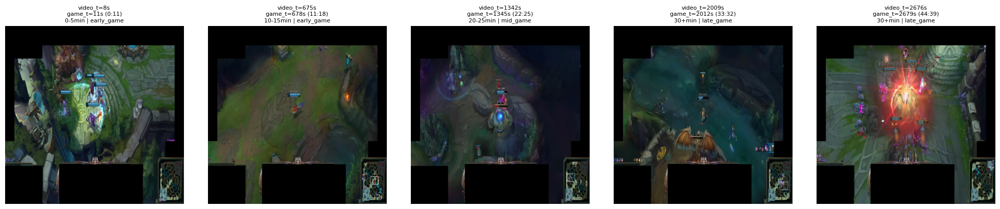

✅ Preview complete! If frames look good, run:
   process_video('taliyah_mid.mp4', sampling_rate_seconds=5)


In [427]:
vid_name = "taliyah_mid.mp4"
preview_video(vid_name, sampling_rate_seconds=5)
# process_video(vid_name, sampling_rate_seconds=5)


🚀 WORKFLOW:

1. Preview individual video:
   preview_video("T1_vs_GenG.mp4", sampling_rate_seconds=5)

2. If good, process it:
   process_video("T1_vs_GenG.mp4", sampling_rate_seconds=5)

3. Repeat for all videos OR run batch:
   process_all_videos(sampling_rate_seconds=5, auto_approve=False)

4. Check metadata:
   pl.read_csv("metadata.csv").head()


############################################################
# VIDEO: zed_jungle.mp4
############################################################

🎬 Previewing: zed_jungle.mp4
⏱️  Video duration: 24 minutes (8s → 1490s)
🎮 Game starts at: 12s (0:12)
🎯 Mask zones: 7 regions
📸 Sampling rate: Every 5 seconds



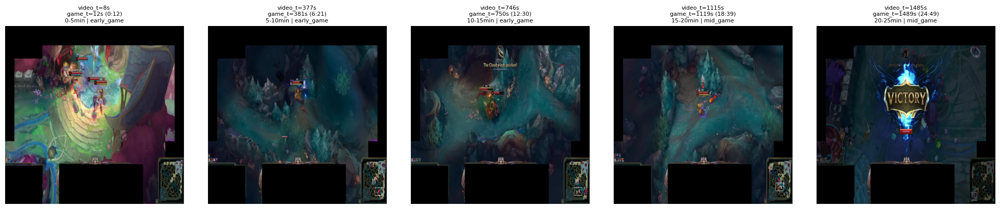

✅ Preview complete! If frames look good, run:
   process_video('zed_jungle.mp4', sampling_rate_seconds=5)
🎬 Processing: zed_jungle.mp4
⏱️  Extracting frames from 8s to 1490s (video time)
🎮 Game time offset: 12s
📸 Sampling every 5 seconds
📊 Expected frames: 297




Extracting frames: 100%|██████████| 297/297 [00:40<00:00,  7.31it/s]



✅ Processing complete!
📊 Frames saved: 297
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id  ┆ video_fol ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---       ┆ der       ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str       ┆ ---       ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│           ┆ str       ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ zed_jungl ┆ processed ┆ frame_148 ┆ zed_jungl ┆ … ┆ 24.7      ┆ 20-25min ┆ mid_game  ┆ [(0, 0,   │
│ e         ┆ _frames/z ┆ 2.jpg     ┆ e/frame_1 ┆   ┆           ┆          ┆           ┆ 1920,     │
│           ┆ ed_jungle ┆           ┆ 482.jpg

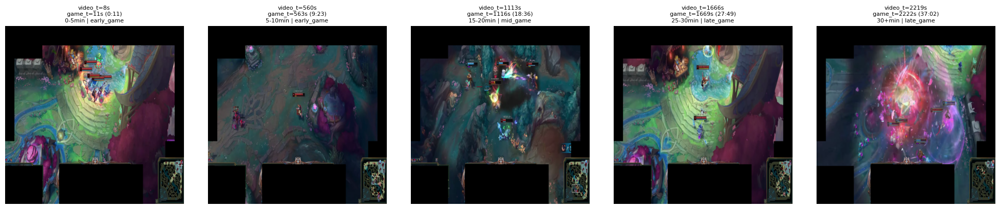

✅ Preview complete! If frames look good, run:
   process_video('akali_mid.mp4', sampling_rate_seconds=5)
🎬 Processing: akali_mid.mp4
⏱️  Extracting frames from 8s to 2224s (video time)
🎮 Game time offset: 11s
📸 Sampling every 5 seconds
📊 Expected frames: 444




Extracting frames: 100%|██████████| 444/444 [01:18<00:00,  5.67it/s]



✅ Processing complete!
📊 Frames saved: 444
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id  ┆ video_fol ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---       ┆ der       ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str       ┆ ---       ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│           ┆ str       ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ akali_mid ┆ processed ┆ frame_221 ┆ akali_mid ┆ … ┆ 36.93     ┆ 30+min   ┆ late_game ┆ [(0, 0,   │
│           ┆ _frames/a ┆ 6.jpg     ┆ /frame_22 ┆   ┆           ┆          ┆           ┆ 1920,     │
│           ┆ kali_mid  ┆           ┆ 16.jpg 

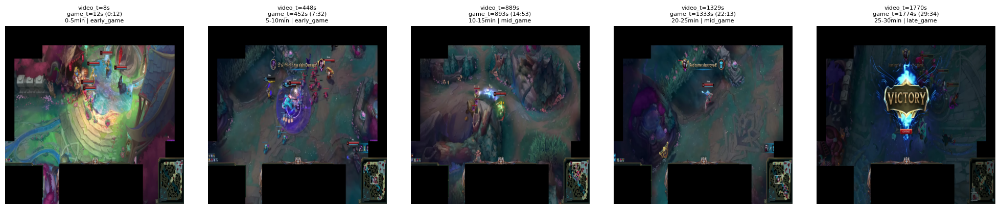

✅ Preview complete! If frames look good, run:
   process_video('diana_jungle.mp4', sampling_rate_seconds=5)
🎬 Processing: diana_jungle.mp4
⏱️  Extracting frames from 8s to 1775s (video time)
🎮 Game time offset: 12s
📸 Sampling every 5 seconds
📊 Expected frames: 354




Extracting frames: 100%|██████████| 354/354 [04:49<00:00,  1.22it/s]  

⚠️  Skipped frame at 1773s (read failed)

✅ Processing complete!
📊 Frames saved: 353
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id  ┆ video_fol ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---       ┆ der       ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str       ┆ ---       ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│           ┆ str       ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ diana_jun ┆ processed ┆ frame_176 ┆ diana_jun ┆ … ┆ 29.37     ┆ 25-30min ┆ late_game ┆ [(0, 0,   │
│ gle       ┆ _frames/d ┆ 2.jpg     ┆ gle/frame ┆   ┆           ┆          ┆           ┆ 1920,     │
│   

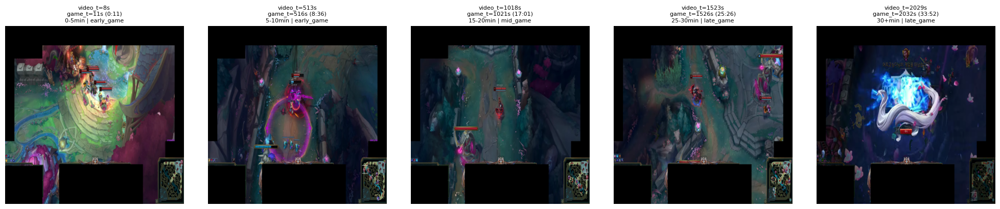

✅ Preview complete! If frames look good, run:
   process_video('jayce_top.mp4', sampling_rate_seconds=5)
🎬 Processing: jayce_top.mp4
⏱️  Extracting frames from 8s to 2034s (video time)
🎮 Game time offset: 11s
📸 Sampling every 5 seconds
📊 Expected frames: 406




Extracting frames: 100%|██████████| 406/406 [00:35<00:00, 11.50it/s]



✅ Processing complete!
📊 Frames saved: 406
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id  ┆ video_fol ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---       ┆ der       ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str       ┆ ---       ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│           ┆ str       ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ jayce_top ┆ processed ┆ frame_202 ┆ jayce_top ┆ … ┆ 33.77     ┆ 30+min   ┆ late_game ┆ [(0, 0,   │
│           ┆ _frames/j ┆ 6.jpg     ┆ /frame_20 ┆   ┆           ┆          ┆           ┆ 1920,     │
│           ┆ ayce_top  ┆           ┆ 26.jpg 

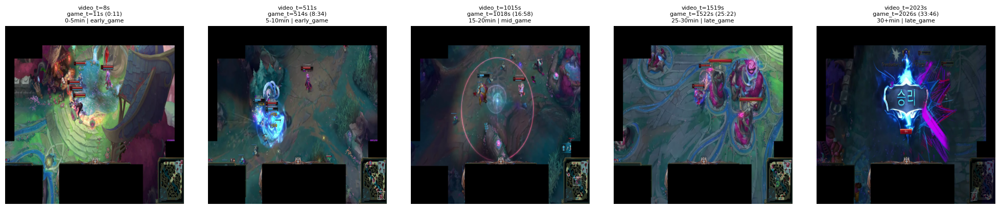

✅ Preview complete! If frames look good, run:
   process_video('jhin_adc.mp4', sampling_rate_seconds=5)
🎬 Processing: jhin_adc.mp4
⏱️  Extracting frames from 8s to 2028s (video time)
🎮 Game time offset: 11s
📸 Sampling every 5 seconds
📊 Expected frames: 404




Extracting frames: 100%|██████████| 404/404 [01:13<00:00,  5.47it/s]



✅ Processing complete!
📊 Frames saved: 404
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌──────────┬────────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id ┆ video_fold ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---      ┆ er         ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str      ┆ ---        ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│          ┆ str        ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞══════════╪════════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ jhin_adc ┆ processed_ ┆ frame_201 ┆ jhin_adc/ ┆ … ┆ 33.6      ┆ 30+min   ┆ late_game ┆ [(0, 0,   │
│          ┆ frames/jhi ┆ 6.jpg     ┆ frame_201 ┆   ┆           ┆          ┆           ┆ 1920,     │
│          ┆ n_adc      ┆           ┆ 6.jpg  

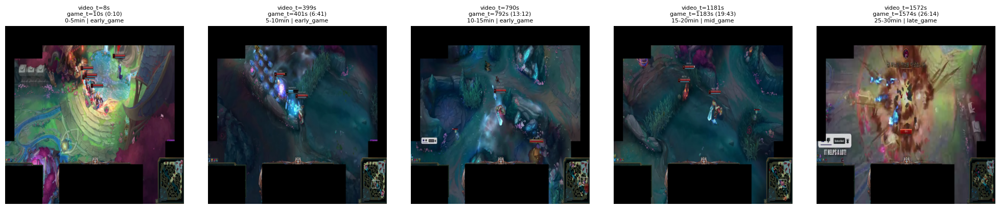

✅ Preview complete! If frames look good, run:
   process_video('trundle_jungle.mp4', sampling_rate_seconds=5)
🎬 Processing: trundle_jungle.mp4
⏱️  Extracting frames from 8s to 1577s (video time)
🎮 Game time offset: 10s
📸 Sampling every 5 seconds
📊 Expected frames: 314




Extracting frames: 100%|██████████| 314/314 [00:21<00:00, 14.34it/s]



✅ Processing complete!
📊 Frames saved: 314
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id  ┆ video_fol ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---       ┆ der       ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str       ┆ ---       ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│           ┆ str       ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ trundle_j ┆ processed ┆ frame_156 ┆ trundle_j ┆ … ┆ 26.08     ┆ 25-30min ┆ late_game ┆ [(0, 0,   │
│ ungle     ┆ _frames/t ┆ 5.jpg     ┆ ungle/fra ┆   ┆           ┆          ┆           ┆ 1920,     │
│           ┆ rundle_ju ┆           ┆ me_1565

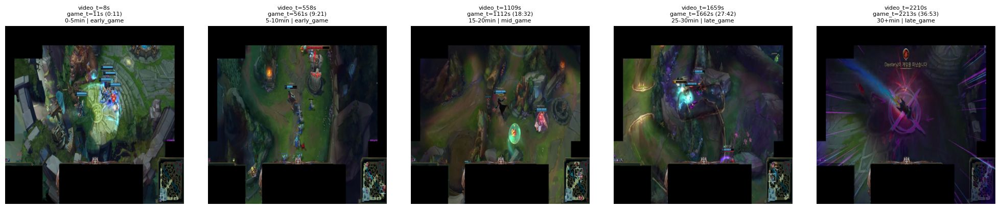

✅ Preview complete! If frames look good, run:
   process_video('lucian_adc.mp4', sampling_rate_seconds=5)
🎬 Processing: lucian_adc.mp4
⏱️  Extracting frames from 8s to 2215s (video time)
🎮 Game time offset: 11s
📸 Sampling every 5 seconds
📊 Expected frames: 442




Extracting frames:  71%|███████▏  | 316/442 [00:51<00:20,  6.02it/s][ WARN:0@53029.779] global cap_ffmpeg_impl.hpp:453 _opencv_ffmpeg_interrupt_callback Stream timeout triggered after 741383.253986 ms
[ WARN:0@53029.779] global cap_ffmpeg_impl.hpp:453 _opencv_ffmpeg_interrupt_callback Stream timeout triggered after 741445.869537 ms
[ WARN:0@53029.779] global cap_ffmpeg_impl.hpp:453 _opencv_ffmpeg_interrupt_callback Stream timeout triggered after 741445.883120 ms
Extracting frames:  72%|███████▏  | 318/442 [13:13<5:27:29, 158.46s/it]

⚠️  Skipped frame at 1593s (read failed)


Extracting frames: 100%|██████████| 442/442 [13:35<00:00,  1.85s/it]   



✅ Processing complete!
📊 Frames saved: 441
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id  ┆ video_fol ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---       ┆ der       ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str       ┆ ---       ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│           ┆ str       ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ lucian_ad ┆ processed ┆ frame_220 ┆ lucian_ad ┆ … ┆ 36.77     ┆ 30+min   ┆ late_game ┆ [(0, 0,   │
│ c         ┆ _frames/l ┆ 6.jpg     ┆ c/frame_2 ┆   ┆           ┆          ┆           ┆ 1920,     │
│           ┆ ucian_adc ┆           ┆ 206.jpg

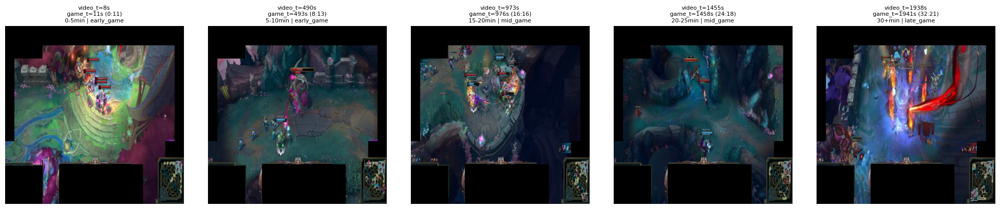

✅ Preview complete! If frames look good, run:
   process_video('fiora_top.mp4', sampling_rate_seconds=5)
🎬 Processing: fiora_top.mp4
⏱️  Extracting frames from 8s to 1943s (video time)
🎮 Game time offset: 11s
📸 Sampling every 5 seconds
📊 Expected frames: 387




Extracting frames: 100%|██████████| 387/387 [00:36<00:00, 10.49it/s]



✅ Processing complete!
📊 Frames saved: 387
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id  ┆ video_fol ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---       ┆ der       ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str       ┆ ---       ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│           ┆ str       ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ fiora_top ┆ processed ┆ frame_193 ┆ fiora_top ┆ … ┆ 32.18     ┆ 30+min   ┆ late_game ┆ [(0, 0,   │
│           ┆ _frames/f ┆ 1.jpg     ┆ /frame_19 ┆   ┆           ┆          ┆           ┆ 1920,     │
│           ┆ iora_top  ┆           ┆ 31.jpg 

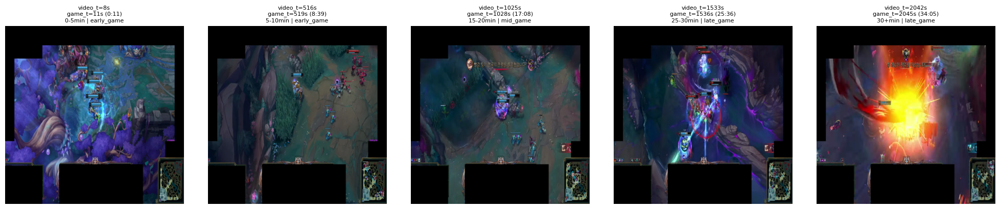

✅ Preview complete! If frames look good, run:
   process_video('ornn_top.mp4', sampling_rate_seconds=5)
🎬 Processing: ornn_top.mp4
⏱️  Extracting frames from 8s to 2047s (video time)
🎮 Game time offset: 11s
📸 Sampling every 5 seconds
📊 Expected frames: 408




Extracting frames: 100%|██████████| 408/408 [00:31<00:00, 13.08it/s]



✅ Processing complete!
📊 Frames saved: 408
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌──────────┬────────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id ┆ video_fold ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---      ┆ er         ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str      ┆ ---        ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│          ┆ str        ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞══════════╪════════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ ornn_top ┆ processed_ ┆ frame_203 ┆ ornn_top/ ┆ … ┆ 33.93     ┆ 30+min   ┆ late_game ┆ [(0, 0,   │
│          ┆ frames/orn ┆ 6.jpg     ┆ frame_203 ┆   ┆           ┆          ┆           ┆ 1920,     │
│          ┆ n_top      ┆           ┆ 6.jpg  

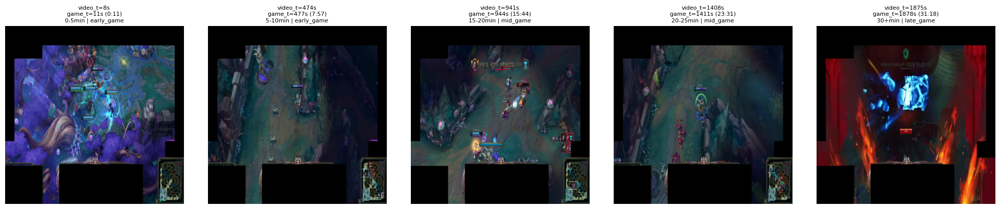

✅ Preview complete! If frames look good, run:
   process_video('kled_top.mp4', sampling_rate_seconds=5)
🎬 Processing: kled_top.mp4
⏱️  Extracting frames from 8s to 1880s (video time)
🎮 Game time offset: 11s
📸 Sampling every 5 seconds
📊 Expected frames: 375




Extracting frames: 100%|██████████| 375/375 [00:32<00:00, 11.59it/s]



✅ Processing complete!
📊 Frames saved: 375
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌──────────┬────────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id ┆ video_fold ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---      ┆ er         ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str      ┆ ---        ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│          ┆ str        ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞══════════╪════════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ kled_top ┆ processed_ ┆ frame_187 ┆ kled_top/ ┆ … ┆ 31.18     ┆ 30+min   ┆ late_game ┆ [(0, 0,   │
│          ┆ frames/kle ┆ 1.jpg     ┆ frame_187 ┆   ┆           ┆          ┆           ┆ 1920,     │
│          ┆ d_top      ┆           ┆ 1.jpg  

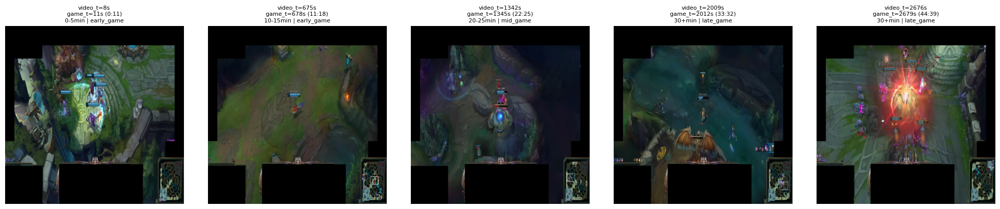

✅ Preview complete! If frames look good, run:
   process_video('taliyah_mid.mp4', sampling_rate_seconds=5)
🎬 Processing: taliyah_mid.mp4
⏱️  Extracting frames from 8s to 2681s (video time)
🎮 Game time offset: 11s
📸 Sampling every 5 seconds
📊 Expected frames: 535




Extracting frames: 100%|██████████| 535/535 [01:08<00:00,  7.82it/s]



✅ Processing complete!
📊 Frames saved: 535
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id  ┆ video_fol ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---       ┆ der       ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str       ┆ ---       ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│           ┆ str       ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ taliyah_m ┆ processed ┆ frame_267 ┆ taliyah_m ┆ … ┆ 44.52     ┆ 30+min   ┆ late_game ┆ [(0, 0,   │
│ id        ┆ _frames/t ┆ 1.jpg     ┆ id/frame_ ┆   ┆           ┆          ┆           ┆ 1920,     │
│           ┆ aliyah_mi ┆           ┆ 2671.jp

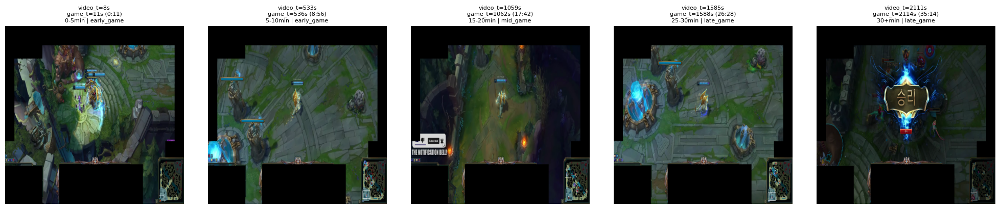

✅ Preview complete! If frames look good, run:
   process_video('galio_mid.mp4', sampling_rate_seconds=5)
🎬 Processing: galio_mid.mp4
⏱️  Extracting frames from 8s to 2116s (video time)
🎮 Game time offset: 11s
📸 Sampling every 5 seconds
📊 Expected frames: 422




Extracting frames: 100%|██████████| 422/422 [06:28<00:00,  1.09it/s]  



✅ Processing complete!
📊 Frames saved: 422
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id  ┆ video_fol ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---       ┆ der       ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str       ┆ ---       ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│           ┆ str       ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ galio_mid ┆ processed ┆ frame_210 ┆ galio_mid ┆ … ┆ 35.1      ┆ 30+min   ┆ late_game ┆ [(0, 0,   │
│           ┆ _frames/g ┆ 6.jpg     ┆ /frame_21 ┆   ┆           ┆          ┆           ┆ 1920,     │
│           ┆ alio_mid  ┆           ┆ 06.jpg 

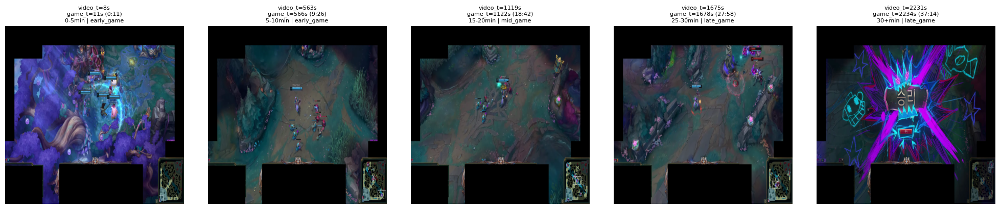

✅ Preview complete! If frames look good, run:
   process_video('yunara_adc.mp4', sampling_rate_seconds=5)
🎬 Processing: yunara_adc.mp4
⏱️  Extracting frames from 8s to 2236s (video time)
🎮 Game time offset: 11s
📸 Sampling every 5 seconds
📊 Expected frames: 446




Extracting frames: 100%|██████████| 446/446 [01:22<00:00,  5.42it/s]



✅ Processing complete!
📊 Frames saved: 446
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id  ┆ video_fol ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---       ┆ der       ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str       ┆ ---       ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│           ┆ str       ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ yunara_ad ┆ processed ┆ frame_222 ┆ yunara_ad ┆ … ┆ 37.1      ┆ 30+min   ┆ late_game ┆ [(0, 0,   │
│ c         ┆ _frames/y ┆ 6.jpg     ┆ c/frame_2 ┆   ┆           ┆          ┆           ┆ 1920,     │
│           ┆ unara_adc ┆           ┆ 226.jpg

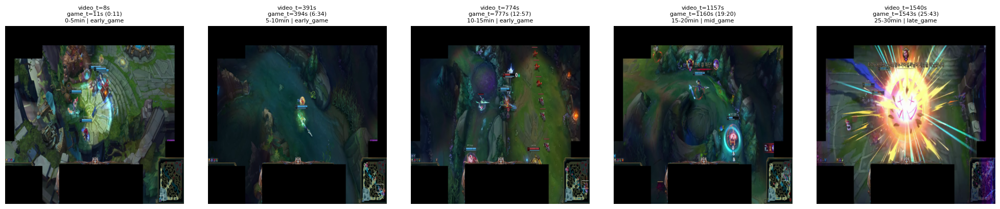

✅ Preview complete! If frames look good, run:
   process_video('xin_jungle.mp4', sampling_rate_seconds=5)
🎬 Processing: xin_jungle.mp4
⏱️  Extracting frames from 8s to 1545s (video time)
🎮 Game time offset: 11s
📸 Sampling every 5 seconds
📊 Expected frames: 308




Extracting frames: 100%|██████████| 308/308 [00:32<00:00,  9.49it/s]



✅ Processing complete!
📊 Frames saved: 308
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id  ┆ video_fol ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---       ┆ der       ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str       ┆ ---       ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│           ┆ str       ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ xin_jungl ┆ processed ┆ frame_153 ┆ xin_jungl ┆ … ┆ 25.6      ┆ 25-30min ┆ late_game ┆ [(0, 0,   │
│ e         ┆ _frames/x ┆ 6.jpg     ┆ e/frame_1 ┆   ┆           ┆          ┆           ┆ 1920,     │
│           ┆ in_jungle ┆           ┆ 536.jpg

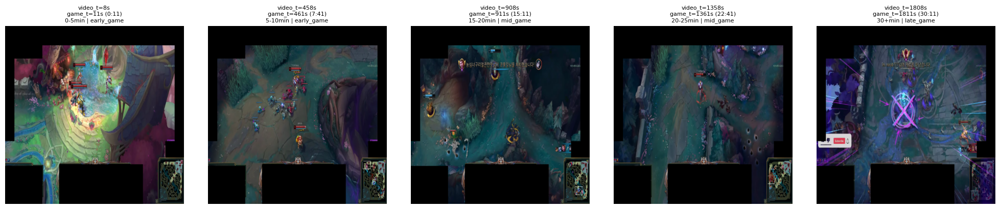

✅ Preview complete! If frames look good, run:
   process_video('kaisa_adc.mp4', sampling_rate_seconds=5)
🎬 Processing: kaisa_adc.mp4
⏱️  Extracting frames from 8s to 1813s (video time)
🎮 Game time offset: 11s
📸 Sampling every 5 seconds
📊 Expected frames: 361




Extracting frames: 100%|██████████| 361/361 [01:07<00:00,  5.33it/s]



✅ Processing complete!
📊 Frames saved: 361
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id  ┆ video_fol ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---       ┆ der       ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str       ┆ ---       ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│           ┆ str       ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ kaisa_adc ┆ processed ┆ frame_180 ┆ kaisa_adc ┆ … ┆ 30.02     ┆ 30+min   ┆ late_game ┆ [(0, 0,   │
│           ┆ _frames/k ┆ 1.jpg     ┆ /frame_18 ┆   ┆           ┆          ┆           ┆ 1920,     │
│           ┆ aisa_adc  ┆           ┆ 01.jpg 

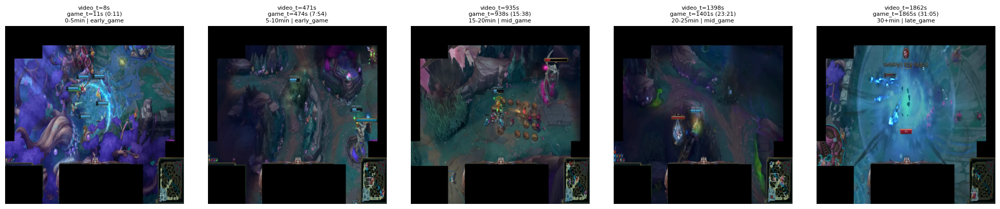

✅ Preview complete! If frames look good, run:
   process_video('qiyana_jungle.mp4', sampling_rate_seconds=5)
🎬 Processing: qiyana_jungle.mp4
⏱️  Extracting frames from 8s to 1867s (video time)
🎮 Game time offset: 11s
📸 Sampling every 5 seconds
📊 Expected frames: 372




Extracting frames: 100%|██████████| 372/372 [00:52<00:00,  7.02it/s]


✅ Processing complete!
📊 Frames saved: 372
💾 Metadata updated: metadata.csv
📂 Frames location: processed_frames

📋 Sample metadata:
shape: (3, 9)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬───────────┐
│ video_id  ┆ video_fol ┆ filename  ┆ relative_ ┆ … ┆ timestamp ┆ bin_fine ┆ bin_coars ┆ mask_zone │
│ ---       ┆ der       ┆ ---       ┆ path      ┆   ┆ _minutes  ┆ ---      ┆ e         ┆ s         │
│ str       ┆ ---       ┆ str       ┆ ---       ┆   ┆ ---       ┆ str      ┆ ---       ┆ ---       │
│           ┆ str       ┆           ┆ str       ┆   ┆ f64       ┆          ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪══════════╪═══════════╪═══════════╡
│ qiyana_ju ┆ processed ┆ frame_185 ┆ qiyana_ju ┆ … ┆ 30.93     ┆ 30+min   ┆ late_game ┆ [(0, 0,   │
│ ngle      ┆ _frames/q ┆ 6.jpg     ┆ ngle/fram ┆   ┆           ┆          ┆           ┆ 1920,     │
│           ┆ iyana_jun ┆           ┆ e_1856.


/var/folders/5d/9l6gb_c515qgg88vn1bg1y340000gn/T/ipykernel_20998/2692291506.py:38: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
(Deprecated in version 0.20.5)
  print(final_metadata.group_by("bin_coarse").agg(pl.count()).sort("bin_coarse"))
/var/folders/5d/9l6gb_c515qgg88vn1bg1y340000gn/T/ipykernel_20998/2692291506.py:40: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
(Deprecated in version 0.20.5)
  print(final_metadata.group_by("bin_fine").agg(pl.count()).sort("bin_fine"))


In [428]:
# ═══════════════════════════════════════════════════════════════════════════
# CELL 5: BATCH PROCESSING WORKFLOW
# ═══════════════════════════════════════════════════════════════════════════

def process_all_videos(sampling_rate_seconds=5, auto_approve=False):
    """
    Process all videos in config
    If auto_approve=False, shows preview and waits for confirmation
    """
    
    for video_name in video_config.keys():
        print(f"\n{'#'*60}")
        print(f"# VIDEO: {video_name}")
        print(f"{'#'*60}\n")
        
        # Show preview
        preview_video(video_name, sampling_rate_seconds)
        
        if not auto_approve:
            response = input("\n👉 Process this video? (y/n): ").strip().lower()
            if response != 'y':
                print("⏭️  Skipped.")
                continue
        
        # Process video
        process_video(video_name, sampling_rate_seconds)
        print("\n" + "="*60 + "\n")
    
    print("🎉 ALL VIDEOS PROCESSED!")
    
    # Final summary
    if METADATA_PATH.exists():
        final_metadata = pl.read_csv(METADATA_PATH)
        print(f"\n📊 FINAL DATASET SUMMARY:")
        print(f"   Total frames: {len(final_metadata)}")
        print(f"   Unique videos: {final_metadata['video_id'].n_unique()}")
        print(f"\n   Distribution by coarse bins:")
        print(final_metadata.group_by("bin_coarse").agg(pl.count()).sort("bin_coarse"))
        print(f"\n   Distribution by fine bins:")
        print(final_metadata.group_by("bin_fine").agg(pl.count()).sort("bin_fine"))


# ═══════════════════════════════════════════════════════════════════════════
# MANUAL WORKFLOW (Recommended for first run)
# ═══════════════════════════════════════════════════════════════════════════

print("""
🚀 WORKFLOW:

1. Preview individual video:
   preview_video("T1_vs_GenG.mp4", sampling_rate_seconds=5)

2. If good, process it:
   process_video("T1_vs_GenG.mp4", sampling_rate_seconds=5)

3. Repeat for all videos OR run batch:
   process_all_videos(sampling_rate_seconds=5, auto_approve=False)

4. Check metadata:
   pl.read_csv("metadata.csv").head()
""")

process_all_videos(sampling_rate_seconds=5, auto_approve=True)

In [429]:
def generate_masking_example(video_name, timestamp_seconds, output_path="results/masking_example.png"):
    if video_name not in video_config:
        print(f"❌ Video '{video_name}' not found in config!")
        return

    config = video_config[video_name]
    video_path = VIDEO_DIR / video_name
    
    if not video_path.exists():
        print(f"❌ Video file not found: {video_path}")
        return

    print(f"📸 Extracting frame at {timestamp_seconds}s from {video_name}...")
    
    frame = extract_frame_at_time(video_path, timestamp_seconds)
    
    if frame is None:
        print(f"❌ Failed to extract frame at {timestamp_seconds}s")
        return

    masked_frame = apply_black_masks(frame, config["mask_zones"])
    
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))
    
    axes[0].imshow(frame)
    axes[0].set_title("Original Frame (Raw Input)", fontsize=14)
    axes[0].axis('off')
    
    axes[1].imshow(masked_frame)
    axes[1].set_title("Masked Frame (Anti-Leakage)", fontsize=14)
    axes[1].axis('off')
    
    plt.tight_layout()
    
    output_file = Path(output_path)
    output_file.parent.mkdir(parents=True, exist_ok=True)
    
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"✅ Masking example saved to: {output_file}")
    
# Example usage:
generate_masking_example("jhin_adc.mp4", timestamp_seconds=600)

📸 Extracting frame at 600s from jhin_adc.mp4...
✅ Masking example saved to: results/masking_example.png


In [430]:
import polars as pl
import numpy as np

df = pl.read_csv("metadata.csv")

timestamps = df["timestamp_seconds"].to_numpy()
mean_pred = np.mean(timestamps)
baseline_mae = np.mean(np.abs(timestamps - mean_pred))

print(f"Mean timestamp: {mean_pred:.2f}s ({mean_pred/60:.2f} min)")
print(f"Baseline MAE (predict mean): {baseline_mae:.2f}s ({baseline_mae/60:.2f} min)")

Mean timestamp: 1000.45s (16.67 min)
Baseline MAE (predict mean): 507.40s (8.46 min)
